<a href="https://colab.research.google.com/github/eduardodavi/Uso_de_banda_larga_nos_Estados_Unidos/blob/main/Uso_de_banda_larga_nos_Estados_Unidos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Uso de banda larga nos Estados Unidos**

**Problemática:**

O case aborda o problema do acesso à internet nos Estados Unidos. Se o acesso à banda larga era um problema antes de 2020, a pandemia o transformou em uma crise. Com o avanço da pandemia, o desenvolvimento das atividades de modo online surgiu como uma alternativa ao perigo temporário de dividir o mesmo local com outras pessoas. No território norte-americano, por exemplo, reuniões do conselho municipal ou de processos judiciais tornaram-se quase inacessíveis para qualquer pessoa cuja conexão não possa suportar uma chamada no Zoom.

Alguns distritos escolares começaram a fornecer pontos de acesso Wi-Fi para alunos sem uma conexão doméstica confiável.Em outros distritos, as crianças se instalam nos estacionamentos do McDonald's apenas para obter um sinal confiável o suficiente para fazer o dever de casa.Além da questão do acesso, ainda existe o problema da qualidade do sinal.
Para ser considerada banda larga a velocidade mínima de download é de 25Mbps, limite ainda considerado baixo para internet de alta qualidade.Após anos de lenta expansão, a lacuna da banda larga tornou-se impossível de ignorar.Sendo assim, a Microsoft resolveu agir e coletar dados de internet em todo o território norte-americano.

**Considerando o contexto do problema e os dados:**

1. O que você pode dizer sobre a qualidade e a expansão territorial da banda larga nos Estados Unidos? Levante e gere visualizações que julgue relevante.
2. Ao considerar o arquivo **predict_broadband_data.csv**, como você, candidato(a) pode ajudar a Microsoft a mapear os CEPS que possuem ou não acesso à internet?
3. Se você tivesse a oportunidade de enviar o seu modelo para a Microsoft com uma proposta para promover a expansão da banda larga, qual seria a sua estratégia adotada? Quais os CEPS de prioridade e por quê?

In [ ]:
# INSTALAÇÃO DO PACOTE DATAPREP
!pip install dataprep

     |████████████████████████████████| 1.8MB 3.9MB/s 
     |████████████████████████████████| 368kB 12.4MB/s 
     |████████████████████████████████| 727kB 13.8MB/s 
     |████████████████████████████████| 81kB 7.6MB/s 
     |████████████████████████████████| 849kB 16.6MB/s 
     |████████████████████████████████| 1.5MB 18.3MB/s 
     |████████████████████████████████| 10.1MB 23.5MB/s 
     |████████████████████████████████| 71kB 7.9MB/s 
     |████████████████████████████████| 1.3MB 42.9MB/s 
     |████████████████████████████████| 51kB 6.6MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 122kB 53.8MB/s 
     |████████████████████████████████| 747kB 43.0MB/s 
     |████████████████████████████████| 143kB 40.6MB/s 
     |████████████████████████████████| 296kB 35.9MB/s 
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149828 sha256=30041e33f487ebbe95354a704cffc0fd8abe4b9d53241c

**1. O que você pode dizer sobre a qualidade e a expansão territorial da banda larga nos Estados Unidos? Levante e gere visualizações que julgue relevante.**

In [ ]:
#CONECTANDO COM OS DADOS
import pandas as pd
df = pd.read_csv('/content/broadband_data.csv',delimiter=';')

In [ ]:
# Conhecendo o dataset
df.head()

,st,county_name,county_id,postal_code,broadband_usage,error_range_(mae)(+/-),error_range_(95%)(+/-),msd
0,SC,Abbeville,45001,29620,"0,398","0,002","0,007","0,000"
1,SC,Abbeville,45001,29659,"0,206","0,152","0,608","0,043"
2,SC,Abbeville,45001,29638,"0,369","0,010","0,031","-0,001"
3,LA,Acadia Parish,22001,70516,"0,032","0,041","0,136","0,004"
4,LA,Acadia Parish,22001,70559,"0,091","0,014","0,043","0,000"


In [ ]:
#Conhecendo o tipo de variáveis
df.dtypes

st                        object
county_name               object
county_id                  int64
postal_code                int64
broadband_usage           object
error_range_(mae)(+/-)    object
error_range_(95%)(+/-)    object
msd                       object
dtype: object

In [ ]:
#Substituindo a Vírgula por ponto no campo 'broadband_usage' antes de alterar o tipo do campo para float 
df['broadband_usage'] = df['broadband_usage'].str.replace(',','.')
#Substituindo a Vírgula por ponto no campo 'error_range_(mae)(+/-)' antes de alterar o tipo do campo para float
df['error_range_(mae)(+/-)'] = df['error_range_(mae)(+/-)'].str.replace(',','.')
#Substituindo a Vírgula por ponto no campo 'error_range_(95%)(+/-)' antes de alterar o tipo do campo para float
df['error_range_(95%)(+/-)'] = df['error_range_(95%)(+/-)'].str.replace(',','.')
#Substituindo a Vírgula por ponto no campo 'msd' antes de alterar o tipo do campo para float
df['msd'] = df['msd'].str.replace(',','.')

In [ ]:
#Alteração de object para float
df['broadband_usage'] = df['broadband_usage'].astype(float)
#Alteração de object para float
df['error_range_(mae)(+/-)'] = df['error_range_(mae)(+/-)'].astype(float)
#Alteração de object para float
df['error_range_(95%)(+/-)'] = df['error_range_(95%)(+/-)'].astype(float)
#Alteração de object para float
df['msd'] = df['msd'].astype(float)

In [ ]:
#Validando as alterações dos tipos de variáveis
df.dtypes

st                         object
county_name                object
county_id                   int64
postal_code                 int64
broadband_usage           float64
error_range_(mae)(+/-)    float64
error_range_(95%)(+/-)    float64
msd                       float64
dtype: object

Carlos, optei por mudar os campos "county_id" e "postal_code" para object, mas, podemos falar mais sobre, ok ?! 

NumExpr defaulting to 2 threads.
E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'error_range_(.../-)'


DataPrep Report
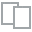
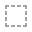
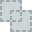
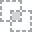
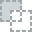
...
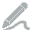
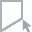
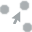
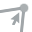
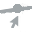

In [ ]:
# RELATÓRIO AUTOMATIZADO
from dataprep.eda import create_report
create_report(df)

E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'error_range_(.../-)'



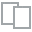
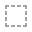
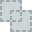
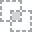
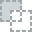
...
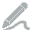
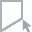
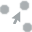
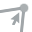
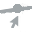

In [ ]:
# RELATÓRIO DE MISSING 
from dataprep.eda import plot_missing
plot_missing(df)


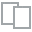
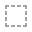
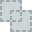
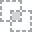
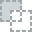
...
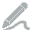
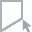
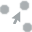
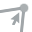
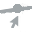

In [ ]:
# RELATÓRIO DE CORRELAÇÃO
from dataprep.eda import plot_correlation
plot_correlation(df)


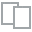
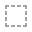
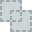
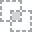
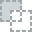
...
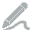
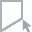
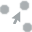
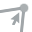
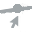

In [ ]:
# RELATÓRIO DE DISTRIBUIÇÃO DE VÁRIAVEIS
from dataprep.eda import plot
plot(df)

**2. Ao considerar o arquivo predict_broadband_data.csv, como você, candidato(a) pode ajudar a Microsoft a mapear os CEPS que possuem ou não acesso à internet?**

O percentual de pessoas sem/pouco acesso a banda larga por CEP é evidenciado no gráfico de dispersão. Acredito que com estás análises se faz possível uma tomada de decisão.  

Filtros:
Selecionar "country_id" como X "Broadband_usage" como Y.

In [ ]:
# INSTALAÇÃO DO PACOTE DATAPREP
!pip install dataprep

In [ ]:
#CONECTANDO COM OS DADOS
import pandas as pd
df = pd.read_csv('/content/predict_broadband_data.csv',delimiter=',')

In [ ]:
# Conhecendo o dataset
df.head()

,st,county_name,county_id,postal_code,broadband_usage,error_range_(mae)(+/-),error_range_(95%)(+/-),msd
0,SC,Abbeville,45001,29639,0.948,0.034,0.110,0.002
1,SC,Abbeville,45001,29628,0.221,0.014,0.043,0.000
2,LA,Acadia Parish,22001,70578,0.201,0.002,0.007,0.000
3,LA,Acadia Parish,22001,70534,0.083,0.034,0.110,0.002
4,VA,Accomack,51001,23337,0.122,0.041,0.136,0.004


In [ ]:
#Conhecendo o tipo de variáveis
df.dtypes

st                         object
county_name                object
county_id                   int64
postal_code                 int64
broadband_usage           float64
error_range_(mae)(+/-)    float64
error_range_(95%)(+/-)    float64
msd                       float64
dtype: object

In [ ]:
#Alteração de object para float
df['broadband_usage'] = df['broadband_usage'].astype(float)
#Alteração de object para float
df['error_range_(mae)(+/-)'] = df['error_range_(mae)(+/-)'].astype(float)
#Alteração de object para float
df['error_range_(95%)(+/-)'] = df['error_range_(95%)(+/-)'].astype(float)
#Alteração de object para float
df['msd'] = df['msd'].astype(float)

E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'error_range_(.../-)'


DataPrep Report
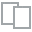
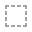
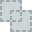
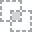
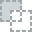
...
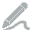
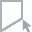
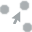
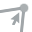
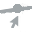

In [ ]:
# RELATÓRIO AUTOMATIZADO
from dataprep.eda import create_report
create_report(df)

**3. Se você tivesse a oportunidade de enviar o seu modelo para a Microsoft com uma proposta para promover a expansão da banda larga, qual seria a sua estratégia adotada? Quais os CEPS de prioridade e por quê?**

Com base no estudo apresentado no gráfico de dispersão, é possível identificar que os condados com CEP até 1500, possuem vaga cobertura de banda larga. Desta forma, indicaria para que estes CEPs fossem os prioritários na expansão de banda larga. 